In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
from sklearn.model_selection import train_test_split
import os
from PIL import Image
from skimage.color import rgb2gray
import h5py

# Description 

We experiment with Data Augmentation in this notebook. We first download the skewed training dataset that we have previously generated (without any augmented images), and train on them. 

Next, we download the augmented dataset, train the models, and evaluate both the models. 

The evaluation metrics we use are: accuracy, precision, recall. 

Recall is especially important since in detecting cancer, we would rather have false positives than false negatives. (It is better to misdiagnose a person as having cancer since this can be rectified but missibng that someone has cancer is a much more serious error). 

We see that the augmented data provides much better results, than the skewed dataset. 

# Downloading skewed data

We download the skewed data and split into training and validation. 

In [0]:
level = 5
slide_subimages_loaded = np.load('train_subimages' +  str(level) +'.npy')
slide_sublabels_loaded = np.load('train_labels' + str(level) + '.npy')

In [0]:
print("training shape", slide_subimages_loaded.shape)
print("labels shape", slide_sublabels_loaded.shape)

training shape (16034, 150, 150, 3)
labels shape (16034,)


In [0]:
X_train, X_val, y_train, y_val = train_test_split(slide_subimages_loaded, slide_sublabels_loaded, test_size=0.33, random_state=42)

# Model Building

We first delete unnecessary objects to save memory. Next we define helper functions. 

In [0]:
del slide_subimages_loaded, slide_sublabels_loaded 

In [0]:
import tensorflow
from keras import models
from keras import layers
from keras import applications

print("X_train", X_train.shape)
print("X_val", X_val.shape)

print("y_train", y_train.shape)
print("y_val", y_val.shape)

X_train (10742, 150, 150, 3)
X_val (5292, 150, 150, 3)
y_train (10742,)
y_val (5292,)


Using TensorFlow backend.


In [0]:
# reads the slide into a numpy array depending on the level we select
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

In [0]:
#we find the tissue percentage in each patch. If there are np tissues (or very little), we ignore the patch since it 
# won't be very useful to us
def find_tissue_percentage(slide_region, window_size):
    
    image_width = window_size
    image_height = window_size

    def find_tissue_pixels(image, intensity=0.8):
        im_gray = rgb2gray(image)
        assert im_gray.shape == (image.shape[0], image.shape[1])
        indices = np.where(im_gray <= intensity)
        return list(zip(indices[0], indices[1]))
    
    tissue_pixels = find_tissue_pixels(slide_region)
    percent_tissue = len(tissue_pixels) / float(image_width * image_height) * 100
    
    return percent_tissue


# We use this function to see if there is any cancer. We do this by seeing if any pixels in the mask are non-zero in 
# the region we are examining (given by patch_centre)
def check_if_cancer(patch_mask, patch_centre):
    patch_size = patch_mask.shape[0]
    offset = int((patch_size-patch_centre)/2)
    sum_vals = np.sum(patch_mask[offset:offset+patch_centre, offset:offset+patch_centre])
    return sum_vals>0

# **Transfer Learning**

We start by using transfer learning (InceptionV3) on the skewed dataset. We get a 94% validation accuracy. We only run the training for three epochs, since we don't want to overfit the data. 

In [0]:
window_size = 150
level = 5
stride = 20

conv_base = applications.inception_v3.InceptionV3(weights='imagenet',
                                        include_top=False,
                                        input_shape=(window_size, window_size, 3))

model_tr = models.Sequential()
model_tr.add(conv_base)
model_tr.add(layers.Flatten())
model_tr.add(layers.Dense(256, activation='relu'))
model_tr.add(layers.Dropout(.5))
model_tr.add(layers.Dense(1, activation='sigmoid'))


print('Number of trainable layers:', len(model_tr.trainable_weights))

model_tr.summary()

Number of trainable layers: 192
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 3, 3, 2048)        21802784  
_________________________________________________________________
flatten_1 (Flatten)          (None, 18432)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               4718848   
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 26,521,889
Trainable params: 26,487,457
Non-trainable params: 34,432
_________________________________________________________________


In [0]:
from keras import optimizers

model_tr.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])

history = model_tr.fit(X_train,
          y_train,
          epochs=3,
          batch_size=128,
          validation_data=(X_val, y_val))
model_tr.save('model_level5_transfer.h5')

Train on 10742 samples, validate on 5292 samples
Epoch 1/3
10742/10742 [==============================] - 53s 5ms/step - loss: 0.3042 - acc: 0.8836 - val_loss: 0.1810 - val_acc: 0.9314

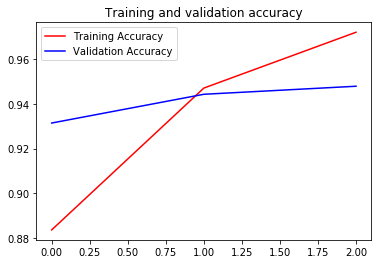

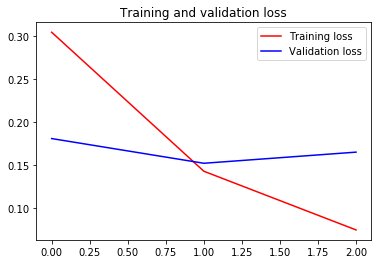

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [0]:
# To get patches for testing, we don't need to return the mask. 
def get_patches_from_images_for_testing(slide, mask, level, window_size, stride):
    
    tissue_threshold = 0.01
    image_deck = []
    mask_labels = []
    
    #At slide level
    image_width = slide.level_dimensions[level][0]
    image_height = slide.level_dimensions[level][1]
    
    x_c = 0
    y_c = 0
    downsample_factor = int(slide.level_downsamples[level]) #2**level
    
    # Move window through the slide
    while y_c < (image_height - window_size + 1):
        while x_c < (image_width - window_size + 1):
            
            # slide image
            slide_region = read_slide(slide, 
                         x= x_c * downsample_factor, 
                         y= y_c * downsample_factor, 
                         level= level, 
                         width= window_size, 
                         height= window_size)
            
            # mask image
            mask_region = read_slide(mask, 
                         x= x_c * downsample_factor, 
                         y= y_c * downsample_factor, 
                         level= level, 
                         width= window_size, 
                         height= window_size)
            
            mask_region = mask_region[:,:,0]

            cancer_present= check_if_cancer(mask_region, 50)
            image_deck.append(slide_region)
            if cancer_present:
                mask_labels.append(1)
            else:
                mask_labels.append(0)
                  
            # move by stride
            x_c += stride
        
        # end of row, reset and move down by stride
        x_c = 0
        y_c += stride
    return image_deck, mask_labels

In [0]:
# We find the test patches for each test slide. We then evaluate our model based on predictions and return them
def get_test_image(test_path, test_mask_path, model):
    test_images = []
    test_masks = []

    test_images.append(open_slide(test_path))
    test_masks.append(open_slide(test_mask_path))
    subimages, sublabels = get_patches_from_images_for_testing(test_images[0], test_masks[0], level, window_size, stride)

    X_test = []
    y_test = []

    X_test.extend(subimages)
    y_test.extend(sublabels)

    X_test = np.asarray(X_test)
    y_test = np.asarray(y_test)
    
    print(X_test.shape)

    predictions = model.predict(X_test)

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print('test acc score:', test_acc)
    return X_test, y_test, predictions, test_images, test_masks

In [0]:
def ret_slide(slide_name):
    slide_object = open_slide(slide_name)
    width = slide_object.level_dimensions[level][0]
    height = slide_object.level_dimensions[level][1]

    image_result = read_slide(slide_object, 
                                x=0, 
                                y=0, 
                                level=level, 
                                width=width, 
                                height=height)
    return image_result

#This is to overlay the heatmap with the actual image
def overlay(slide_name, level, predicted_mask):
    image_result = ret_slide(slide_name)
    if "mask" in slide_name:
        image_result = image_result[:,:,0]
    
    plt.figure(figsize=(10,10), dpi=100)
    plt.imshow(image_result,alpha=0.75)
    plt.imshow(predicted_mask, cmap='jet', alpha=0.5)

In [0]:
def get_mask(slide_name, level):
    image_result = ret_slide(slide_name)
    image_result = image_result[:,:,0] 
    return image_result

In [0]:
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, recall_score, precision_score, confusion_matrix
def calc_metrics(y_test,predictions, thresh = 0.8):
    true_class = y_test
    pred_class = predictions
    
    roc_auc = roc_auc_score(np.array(true_class) == 1, pred_class)

    precision = precision_score(np.array(true_class) == 1, np.array(pred_class) >=  thresh)
    recall = recall_score(np.array(true_class) == 1, np.array(pred_class) >=  thresh)
    f1 = f1_score(np.array(true_class) == 1, np.array(pred_class) >=  thresh)

    print('Precision score: %.3f' % precision)
    print('Recall score: %.3f' % recall)
    print('F1 score: %.3f' % f1)
    print('ROC AUC score: %.3f' % roc_auc)

    print(confusion_matrix(np.array(true_class) == 1, np.array(pred_class) >=  thresh))

In [0]:
def get_heatmap(test_images, predictions, model, threshold=0.8):
    width = test_images[0].level_dimensions[level][0]
    height = test_images[0].level_dimensions[level][1]

    predicted_mask = np.zeros((height, width))

    x_c = 0
    y_c = 0

    for p in predictions:
        if p > threshold:
            predicted_mask[int(y_c + (window_size / 2) - (stride / 2)):int(y_c + (window_size / 2) + (stride / 2)), 
                           int(x_c + (window_size / 2) - (stride / 2)):int(x_c + (window_size / 2) + (stride / 2))] = 1

        x_c+= stride
        if x_c > (width - window_size):
            x_c = 0
            y_c += stride
            
    return predicted_mask



## Experiment 1 

*Transfer learning with non-augmented/unbalanced dataset*

We test our model on three slides : 091, 110, 096 (in that order)

For each test image, the predicted mask is shown first, next the actual mask, and finally the slide with the heatmap overlaid. 

### TEST 1

#### Predicted mask shown below :

(9025, 150, 150, 3)
9025/9025 [==============================] - 11s 1ms/step

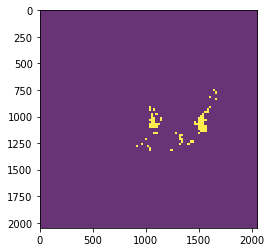

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('./tumor_091.tif','./tumor_091_mask.tif',model_tr)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_tr)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

#### Actual mask shown below :

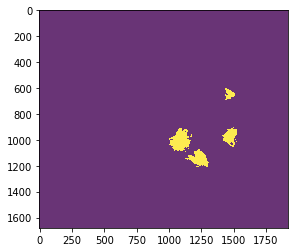

In [0]:
mask_region = get_mask('./tumor_091_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

#### Overlaid image show below :

The cancer is the red area. 

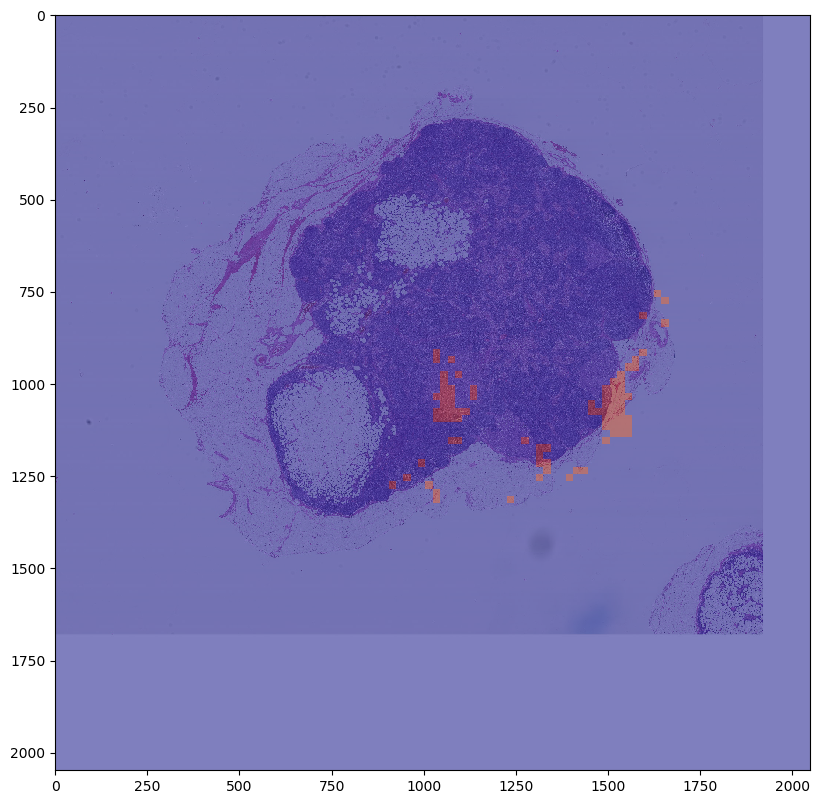

In [0]:
overlay('../vatsala-adl/tumor_091.tif', 5, predicted_mask )

### TEST 2

(17787, 150, 150, 3)
17787/17787 [==============================] - 21s 1ms/step

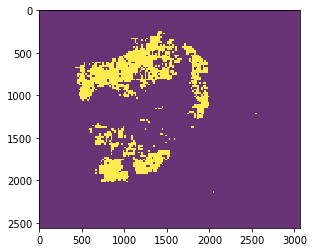

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_110.tif','../vatsala-adl/tumor_110_mask.tif',model_tr)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_tr)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

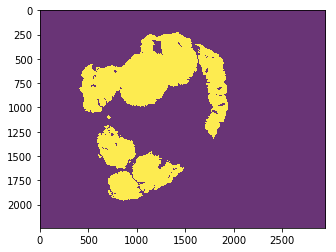

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_110_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

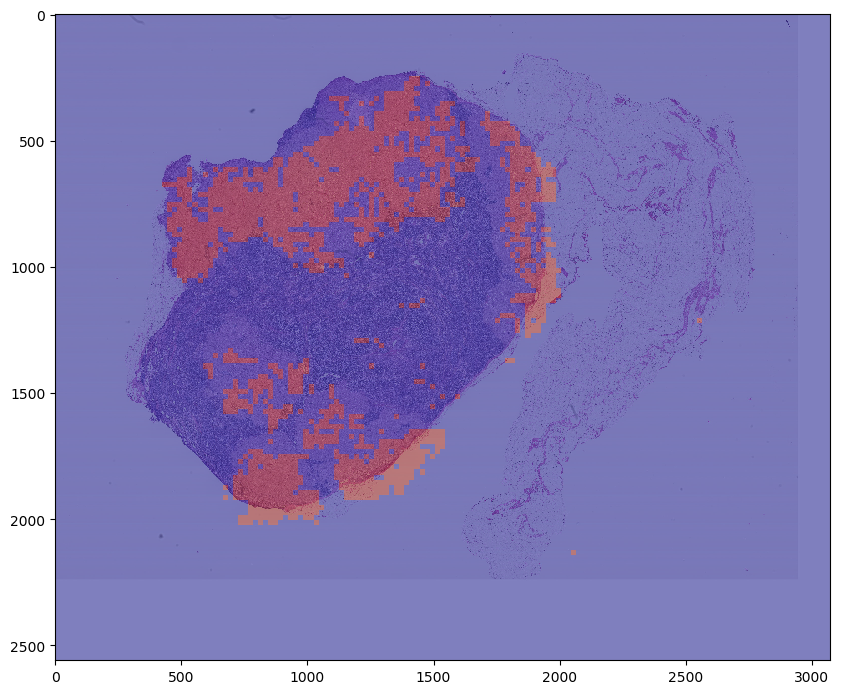

In [0]:
overlay('../vatsala-adl/tumor_110.tif', 5, predicted_mask )

### TEST 3

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_096.tif','../vatsala-adl/tumor_096_mask.tif',model_tr)
calc_metrics(y_test,predictions)

(23958, 150, 150, 3)
23958/23958 [==============================] - 27s 1ms/step

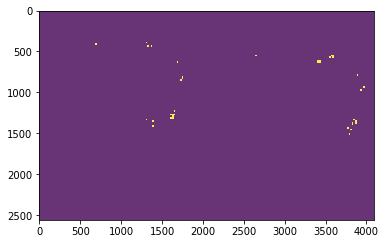

In [0]:
predicted_mask = get_heatmap(test_images, predictions, model_tr)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

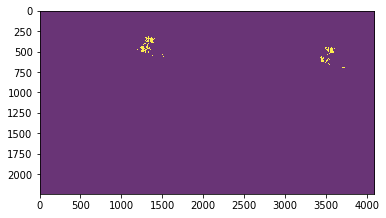

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_096_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

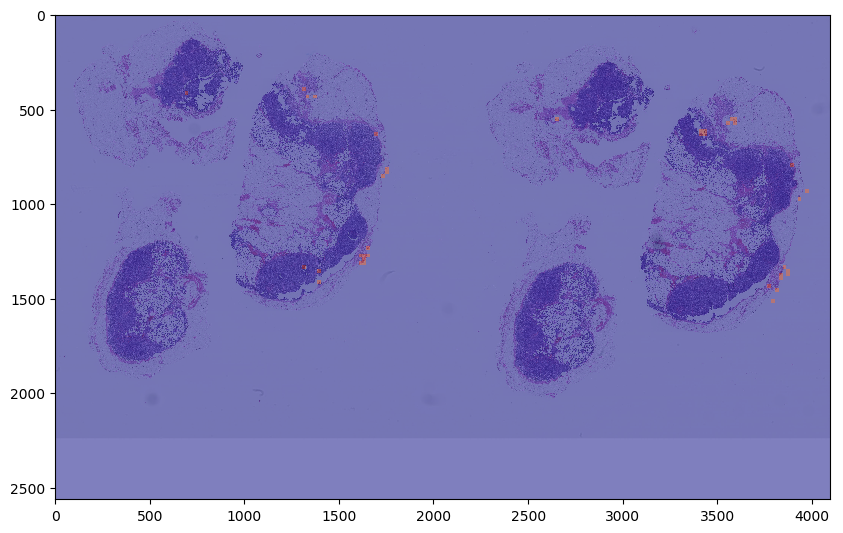

In [0]:
overlay('../vatsala-adl/tumor_096.tif', 5, predicted_mask )

# Convolution experiments

## Experiment 2

*CNNs with non-augmented/unbalanced dataset*

We test our model on three slides : 091, 110, 096 (in that order)

For each test image, the predicted mask is shown first, next the actual mask, and finally the slide with the heatmap overlaid. 

In [0]:
model_conv_scratch = models.Sequential()
model_conv_scratch.add(layers.Conv2D(128, (3, 3), activation='relu',
                        input_shape=(window_size, window_size, 3)))
model_conv_scratch.add(layers.MaxPooling2D((2, 2)))

model_conv_scratch.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_conv_scratch.add(layers.MaxPooling2D((2, 2)))

model_conv_scratch.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_conv_scratch.add(layers.MaxPooling2D((2, 2)))

model_conv_scratch.add(layers.Conv2D(32, (3, 3), activation='relu'))
model_conv_scratch.add(layers.MaxPooling2D((2, 2)))

model_conv_scratch.add(layers.Flatten())
model_conv_scratch.add(layers.Dense(128, activation='relu'))
model_conv_scratch.add(layers.Dense(1, activation='sigmoid'))
model_conv_scratch.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_95 (Conv2D)           (None, 148, 148, 128)     3584      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 128)       0         
_________________________________________________________________
conv2d_96 (Conv2D)           (None, 72, 72, 64)        73792     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_97 (Conv2D)           (None, 34, 34, 64)        36928     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 64)        0         
_________________________________________________________________
conv2d_98 (Conv2D)           (None, 15, 15, 32)        18464     
__________

In [0]:
from keras import optimizers

model_conv_scratch.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])

history = model_conv_scratch.fit(X_train,
          y_train,
          epochs=20,
          batch_size=128,
          validation_data=(X_val, y_val))



Train on 10742 samples, validate on 5292 samples
Epoch 1/20
10742/10742 [==============================] - 18s 2ms/step - loss: 0.7045 - acc: 0.8133 - val_loss: 0.2966 - val_acc: 0.8649

In [0]:
model_conv_scratch.save('model_level5_scratch.h5')

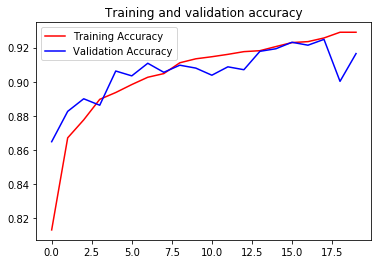

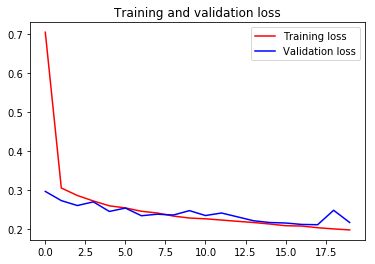

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### TEST 1

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('./tumor_091.tif','./tumor_091_mask.tif',model_conv_scratch)
calc_metrics(y_test,predictions)

(9025, 150, 150, 3)
9025/9025 [==============================] - 4s 439us/step

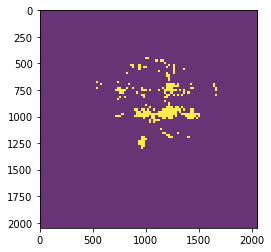

In [0]:
predicted_mask = get_heatmap(test_images, predictions, model_conv_scratch)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

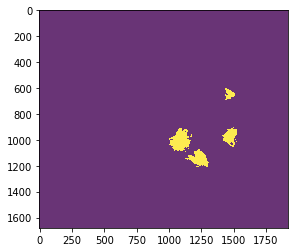

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_091_mask.tif',4)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

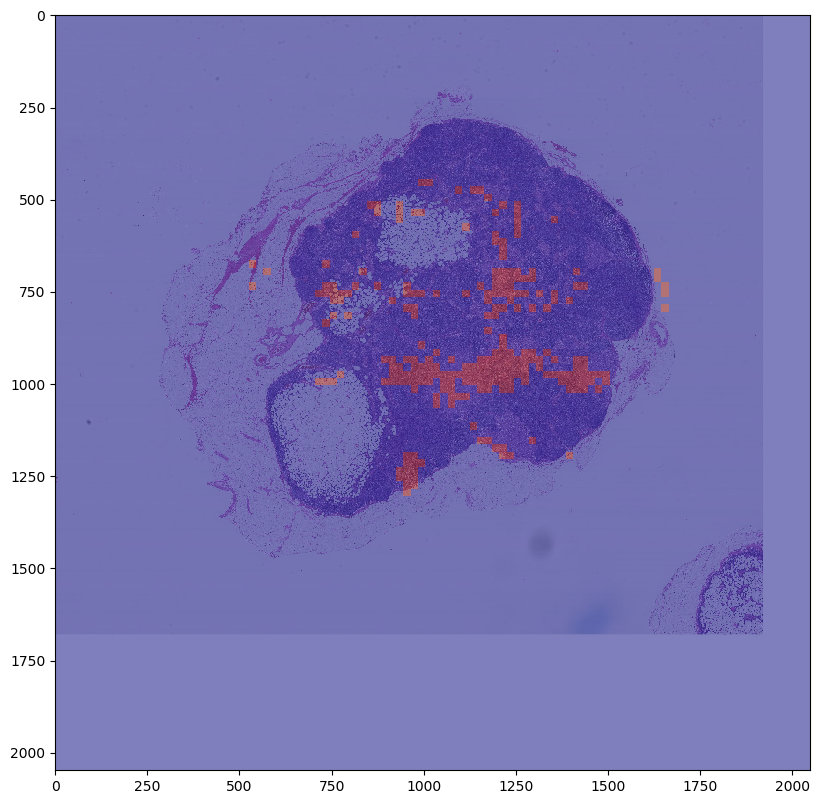

In [0]:
overlay('../vatsala-adl/tumor_091.tif', 5, predicted_mask )

### TEST 2

(17787, 150, 150, 3)
17787/17787 [==============================] - 8s 458us/step

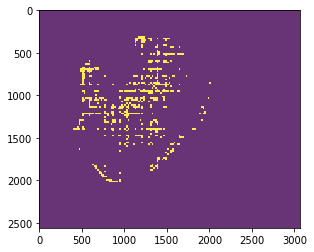

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_110.tif','../vatsala-adl/tumor_110_mask.tif',model_conv_scratch)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_conv_scratch, 0.5)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

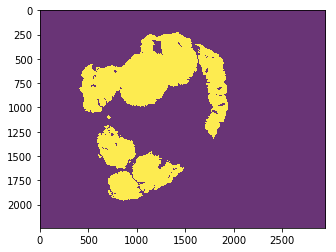

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_110_mask.tif',4)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

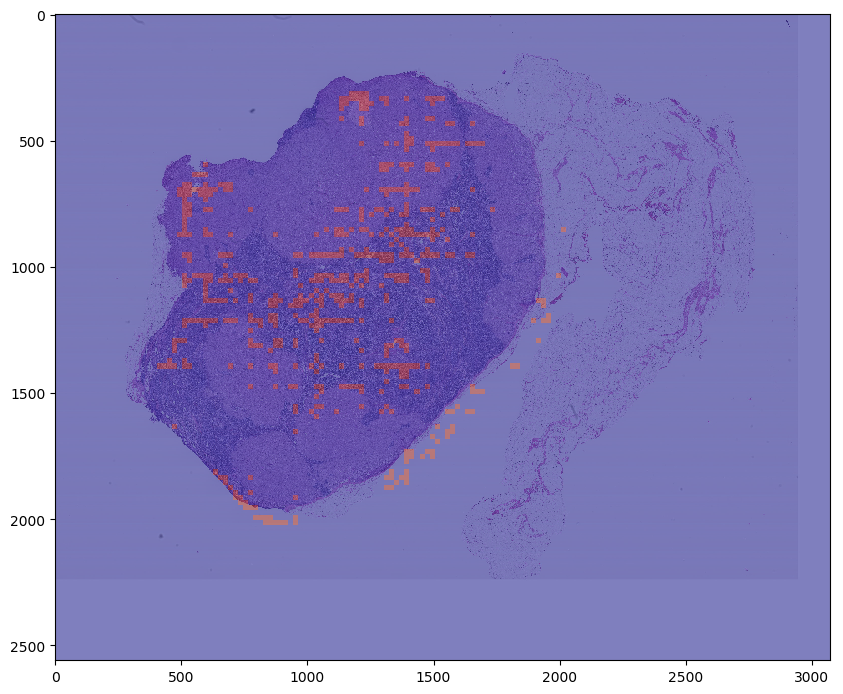

In [0]:
overlay('../vatsala-adl/tumor_110.tif', 5, predicted_mask )

### TEST 3 

(23958, 150, 150, 3)
23958/23958 [==============================] - 11s 460us/step

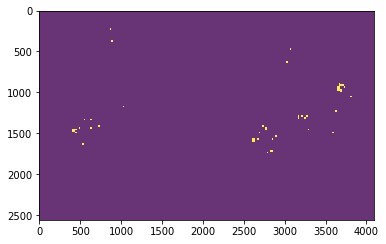

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_096.tif','../vatsala-adl/tumor_096_mask.tif',model_conv_scratch)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_conv_scratch)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

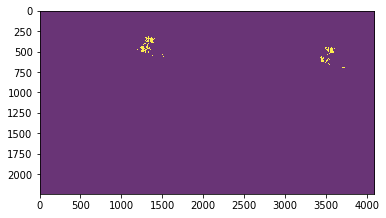

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_096_mask.tif',4)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

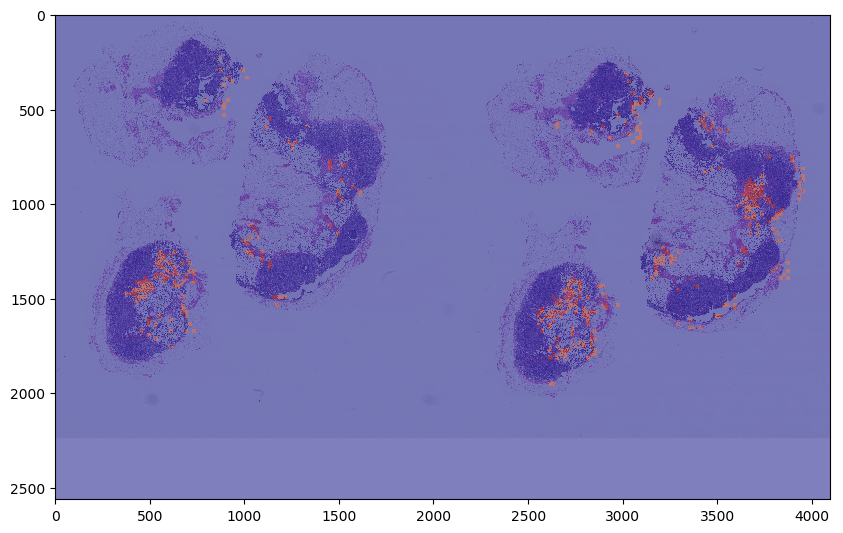

In [0]:
overlay('../vatsala-adl/tumor_096.tif', 5, predicted_mask )

## Comparison between transfer learning and CNNs (for skewed data)

We can see that the transfer learning performs better than CNNs in the case of skewed data. The reason could be that CNN undefits the data since it does not have as many parameters to generalise the tumors from such skewed data. 

The recall, precision, and accuracy is usually higher for transfer learning, and this can also be seen in the heatmap visualisations.

We now experiment with Augmented data, which should result in a more balanced dataset. 

# Experiments with Augmented Data

In [0]:
level = 5

slide_subimages_loaded = np.load('train_subimages_augmented' +  str(level) +'.npy')
slide_sublabels_loaded = np.load('train_labels_augmented' + str(level) + '.npy')

In [0]:
print("training shape", slide_subimages_loaded.shape)
print("labels shape", slide_sublabels_loaded.shape)

training shape (17871, 150, 150, 3)
labels shape (17871,)


In [0]:
X_train, X_val, y_train, y_val = train_test_split(slide_subimages_loaded, slide_sublabels_loaded, test_size=0.33, random_state=42)

In [0]:
del slide_subimages_loaded, slide_sublabels_loaded 

## Experiment 3
*Transfer learning with augmented data*

In [0]:
window_size = 150
level = 5
stride = 20

conv_base = applications.inception_v3.InceptionV3(weights='imagenet',
                                        include_top=False,
                                        input_shape=(window_size, window_size, 3))

model_tr_aug = models.Sequential()
model_tr_aug.add(conv_base)
model_tr_aug.add(layers.Flatten())
model_tr_aug.add(layers.Dense(256, activation='relu'))
model_tr_aug.add(layers.Dropout(.5))
model_tr_aug.add(layers.Dense(1, activation='sigmoid'))


print('Number of trainable layers:', len(model_tr_aug.trainable_weights))

model_tr_aug.summary()

Number of trainable layers: 192
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 3, 3, 2048)        21802784  
_________________________________________________________________
flatten_3 (Flatten)          (None, 18432)             0         
_________________________________________________________________
dense_5 (Dense)              (None, 256)               4718848   
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 257       
Total params: 26,521,889
Trainable params: 26,487,457
Non-trainable params: 34,432
_________________________________________________________________


In [0]:
from keras import optimizers

model_tr_aug.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])

history = model_tr_aug.fit(X_train,
          y_train,
          epochs=3,
          batch_size=128,
          validation_data=(X_val, y_val))
model_tr_aug.save('model_level5_transfer_aug.h5')

Train on 11973 samples, validate on 5898 samples
Epoch 1/3
11973/11973 [==============================] - 49s 4ms/step - loss: 0.4744 - acc: 0.7815 - val_loss: 0.3261 - val_acc: 0.8577

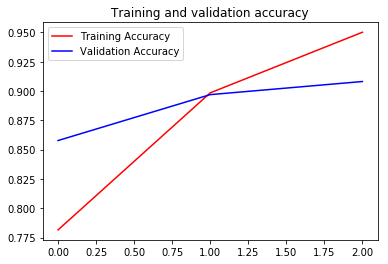

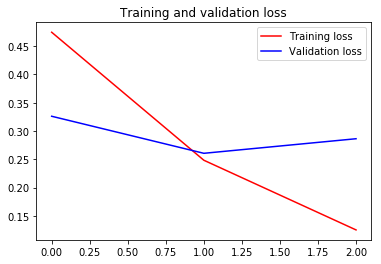

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### TEST 1

(9025, 150, 150, 3)
9025/9025 [==============================] - 11s 1ms/step

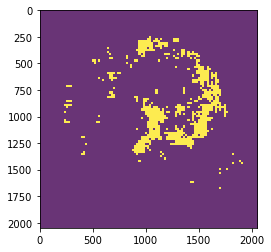

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('./tumor_091.tif','./tumor_091_mask.tif',model_tr_aug)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_tr_aug, 0.8)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

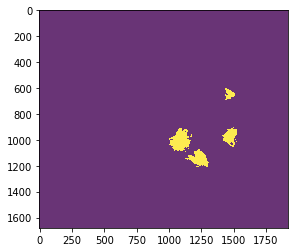

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_091_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

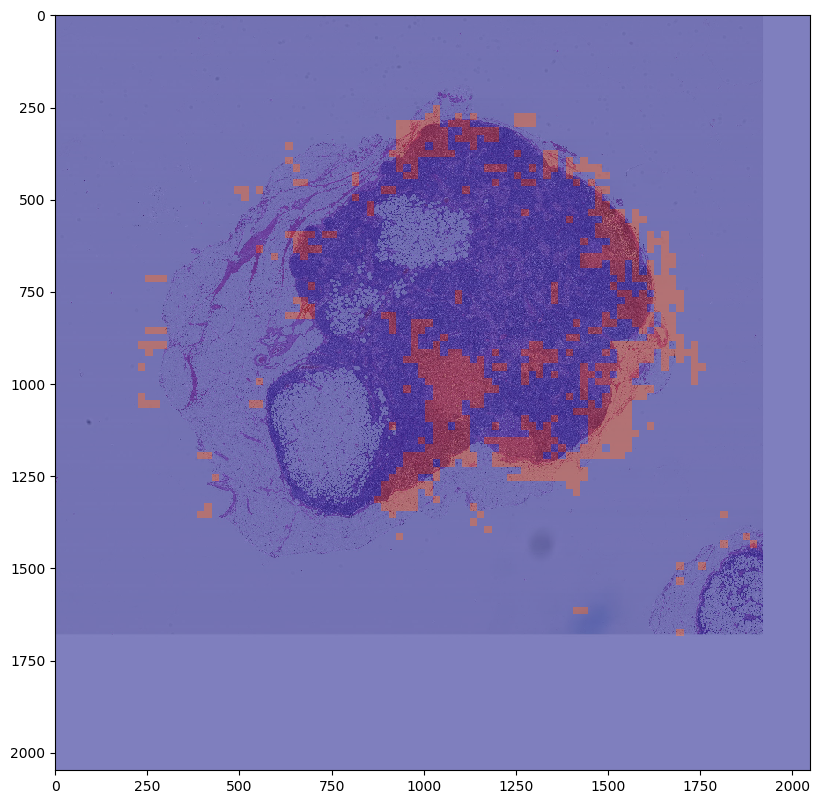

In [0]:
overlay('../vatsala-adl/tumor_091.tif', 5, predicted_mask )

### TEST 2

(17787, 150, 150, 3)
17787/17787 [==============================] - 22s 1ms/step

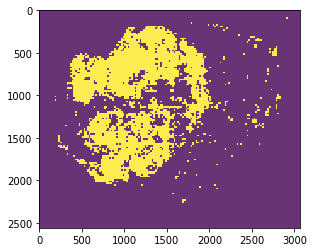

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_110.tif','../vatsala-adl/tumor_110_mask.tif',model_tr_aug)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_tr_aug, 0.8)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

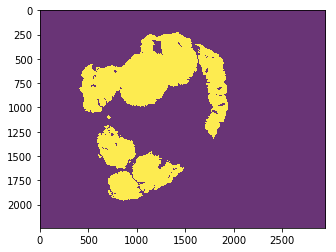

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_110_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

Level:  5
Dimensions: (3072, 2560)


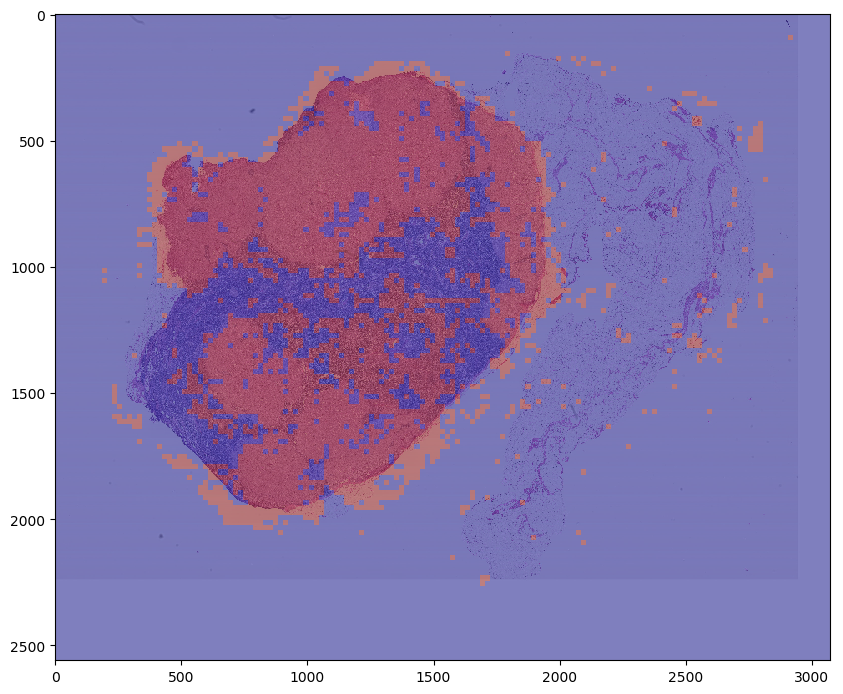

In [0]:
overlay('../vatsala-adl/tumor_110.tif', 5, predicted_mask )

### TEST 3

(23958, 150, 150, 3)
23958/23958 [==============================] - 29s 1ms/step

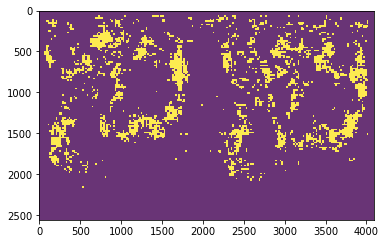

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_096.tif','../vatsala-adl/tumor_096_mask.tif',model_tr_aug)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_tr_aug, 0.8)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

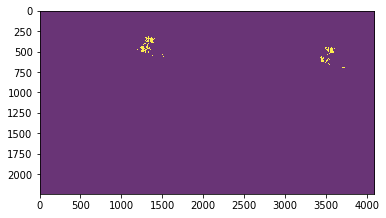

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_096_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

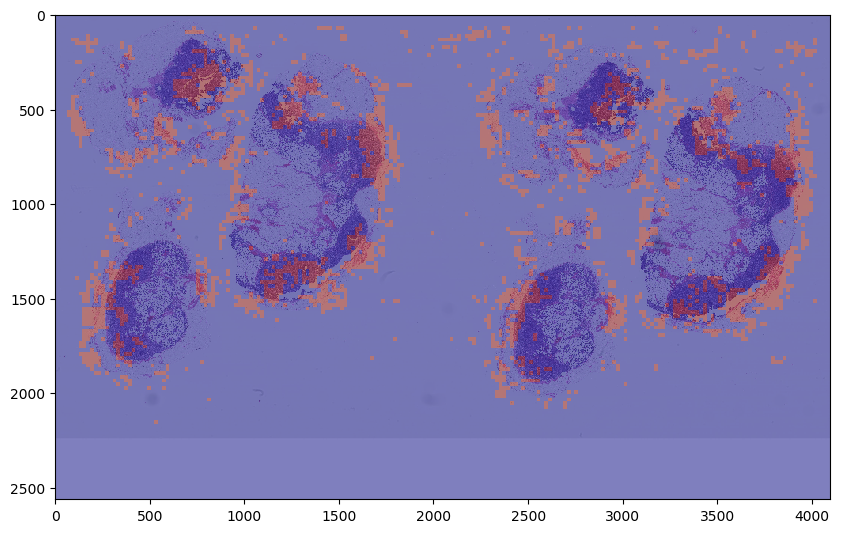

In [0]:
overlay('../vatsala-adl/tumor_096.tif', 5, predicted_mask )

## Experiment 4

*CNNs with augmented data *

In [0]:
model_conv_aug = models.Sequential()
model_conv_aug.add(layers.Conv2D(128, (3, 3), activation='relu',
                        input_shape=(window_size, window_size, 3)))
model_conv_aug.add(layers.MaxPooling2D((2, 2)))

model_conv_aug.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_conv_aug.add(layers.MaxPooling2D((2, 2)))

model_conv_aug.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_conv_aug.add(layers.MaxPooling2D((2, 2)))

model_conv_aug.add(layers.Conv2D(32, (3, 3), activation='relu'))
model_conv_aug.add(layers.MaxPooling2D((2, 2)))

model_conv_aug.add(layers.Flatten())
model_conv_aug.add(layers.Dense(128, activation='relu'))
model_conv_aug.add(layers.Dense(1, activation='sigmoid'))
model_conv_aug.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_193 (Conv2D)          (None, 148, 148, 128)     3584      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 74, 74, 128)       0         
_________________________________________________________________
conv2d_194 (Conv2D)          (None, 72, 72, 64)        73792     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_195 (Conv2D)          (None, 34, 34, 64)        36928     
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 17, 17, 64)        0         
_________________________________________________________________
conv2d_196 (Conv2D)          (None, 15, 15, 32)        18464     
__________

In [0]:
from keras import optimizers

model_conv_aug.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])

history = model_conv_aug.fit(X_train,
          y_train,
          epochs=20,
          batch_size=128,
          validation_data=(X_val, y_val))

Train on 11973 samples, validate on 5898 samples
Epoch 1/20
11973/11973 [==============================] - 23s 2ms/step - loss: 4.3805 - acc: 0.6153 - val_loss: 0.6662 - val_acc: 0.7018

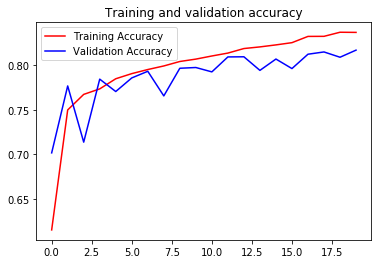

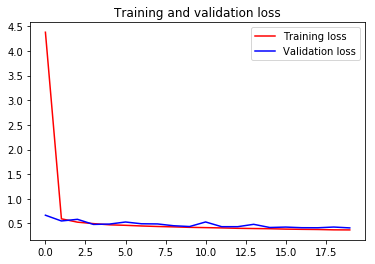

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### TEST 1

(9025, 150, 150, 3)
9025/9025 [==============================] - 4s 482us/step

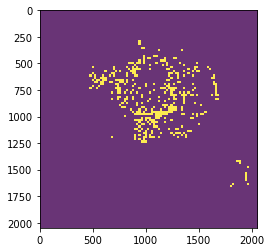

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('./tumor_091.tif','./tumor_091_mask.tif',model_conv_aug)
calc_metrics(y_test,predictions ,0.8)
predicted_mask = get_heatmap(test_images, predictions, model_conv_aug, 0.9)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

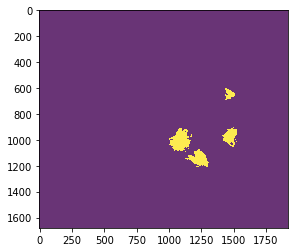

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_091_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

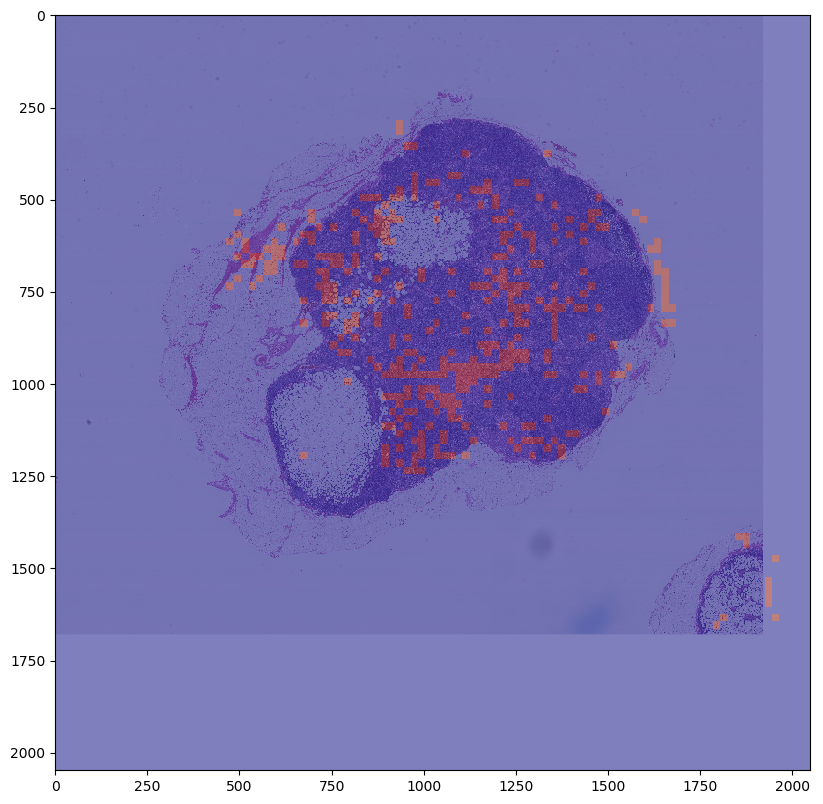

In [0]:
overlay('../vatsala-adl/tumor_091.tif', 5, predicted_mask )

### TEST 2

(17787, 150, 150, 3)
17787/17787 [==============================] - 8s 461us/step

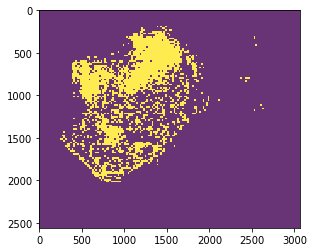

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_110.tif','../vatsala-adl/tumor_110_mask.tif',model_conv_aug)
calc_metrics(y_test,predictions)
predicted_mask = get_heatmap(test_images, predictions, model_conv_aug,0.8)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

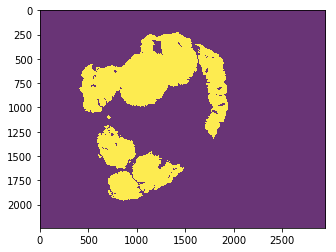

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_110_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

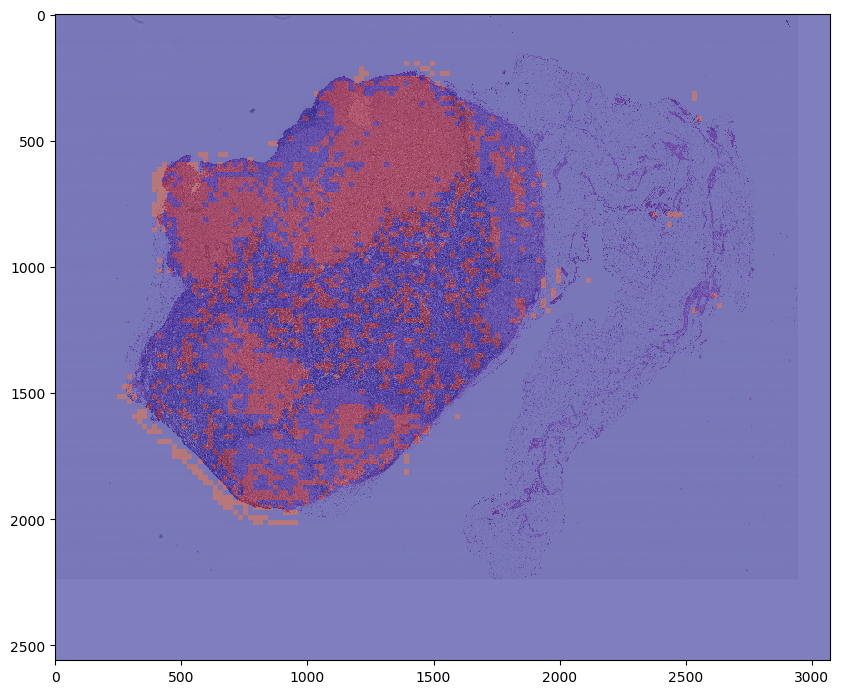

In [0]:
overlay('../vatsala-adl/tumor_110.tif', 5, predicted_mask )

### TEST 3

In [0]:
X_test, y_test, predictions, test_images, test_masks = get_test_image('../vatsala-adl/tumor_096.tif','../vatsala-adl/tumor_096_mask.tif',model_conv_aug)
calc_metrics(y_test,predictions)

(23958, 150, 150, 3)
23958/23958 [==============================] - 11s 474us/step

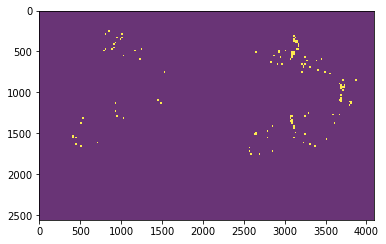

In [0]:
predicted_mask = get_heatmap(test_images, predictions, model_conv_aug, 0.99)
plt.imshow(predicted_mask,cmap='viridis', vmin=0, vmax=1, alpha=0.8)

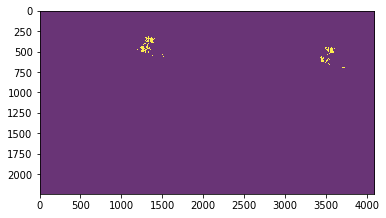

In [0]:
mask_region = get_mask('../vatsala-adl/tumor_096_mask.tif',5)
plt.imshow(mask_region, cmap='viridis', vmin=0, vmax=1, alpha=0.8)

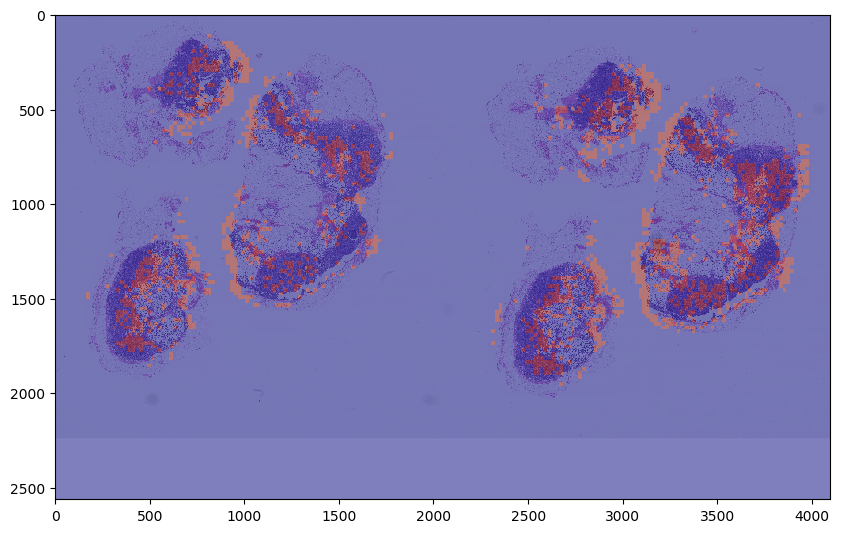

In [0]:
overlay('../vatsala-adl/tumor_096.tif', 5, predicted_mask )
    

We can clearly see that the augmented data results in better testing performance. Both CNNs and transfer learning show an increase in recall, precision, and accuracy. 

We should also note the the loss consistently decreases for CNNs, while this is not the case for transfer learning. 

In general, CNNs' performance is comparable to transfer learning if not better (as in image 110). The number of parameters transfer learning uses is about 26 million, while a simpler network achieves similar results in just 333,000 parameters. Thus, we do not necessarily need transfer learning in this instance. Transfer learning is usally useful when we need to detect common objects and shapes (such as cats), but not so much for medical testing since it hasn't been trained for that. 


Overall, across all three images, image 110 usually has the best results. This may be because we have trained our model on two slides, both of which have a large amount of tumors. Thus, the model may be overfitting to image 110's type. 